In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


Useful funtions

In [2]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


Get Data

In [3]:
df = pd.read_csv("data/train.csv", sep = ";")
df


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [4]:
df_embedding = pd.read_csv("./embedding_train.csv", sep = ",")
df_embedding

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043648,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
2,0.129104,0.024414,0.038848,0.013183,-0.050029,-0.010853,-0.048810,-0.026371,-0.050805,-0.002958,...,0.035086,-0.018932,0.056284,0.026366,-0.023457,-0.043787,0.147508,-0.037356,-0.016634,0.033980
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
4,0.071991,0.045889,0.059294,0.045941,-0.035749,-0.024802,-0.026213,-0.035222,-0.058413,-0.025642,...,0.034485,0.005421,0.019619,0.019163,-0.037395,-0.017155,0.145237,-0.038857,-0.054125,0.045941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002852,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620
45209,0.079211,0.028601,0.060208,0.027604,-0.055871,0.026986,-0.051449,-0.031026,-0.046522,0.005721,...,0.041762,-0.016296,0.039103,-0.006219,-0.025536,-0.037247,0.099956,-0.033059,-0.054432,0.051829


In [5]:
# EDA
df_embedding.describe()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,...,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,0.088593,0.027315,0.061536,0.031920,-0.057178,-0.002197,-0.052931,-0.024540,-0.045560,-0.003239,...,0.042146,-0.010183,0.044464,0.003040,-0.038962,-0.026547,0.134927,-0.033142,-0.035534,0.043291
std,0.013565,0.013035,0.007986,0.009555,0.010709,0.014657,0.012188,0.009497,0.011354,0.009377,...,0.008138,0.009897,0.009364,0.009229,0.012783,0.010692,0.018221,0.006834,0.014325,0.010975
min,0.032475,-0.026224,0.021499,-0.007189,-0.103823,-0.041052,-0.108909,-0.057012,-0.088444,-0.043999,...,0.001508,-0.050966,0.008089,-0.024251,-0.078138,-0.073827,0.083706,-0.064175,-0.084658,-0.007387
25%,0.079372,0.018758,0.056937,0.025286,-0.064530,-0.012252,-0.061378,-0.031230,-0.052463,-0.009183,...,0.036978,-0.017219,0.038356,-0.003812,-0.048149,-0.033979,0.120675,-0.037732,-0.045869,0.036082
50%,0.087465,0.026933,0.061142,0.031286,-0.056865,-0.003616,-0.053485,-0.025428,-0.045553,-0.001690,...,0.042041,-0.010570,0.045425,0.002880,-0.037991,-0.026443,0.137433,-0.032886,-0.036313,0.043628
75%,0.097025,0.037001,0.065662,0.037285,-0.049639,0.006080,-0.044687,-0.018271,-0.038219,0.003792,...,0.047352,-0.003669,0.051250,0.008698,-0.029765,-0.018783,0.147768,-0.028487,-0.025442,0.050842
max,0.149143,0.092758,0.102931,0.074532,-0.018740,0.043262,-0.008092,0.015650,-0.002182,0.025366,...,0.079373,0.029456,0.071565,0.044127,0.006524,0.010326,0.191719,-0.000310,0.015822,0.083836




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



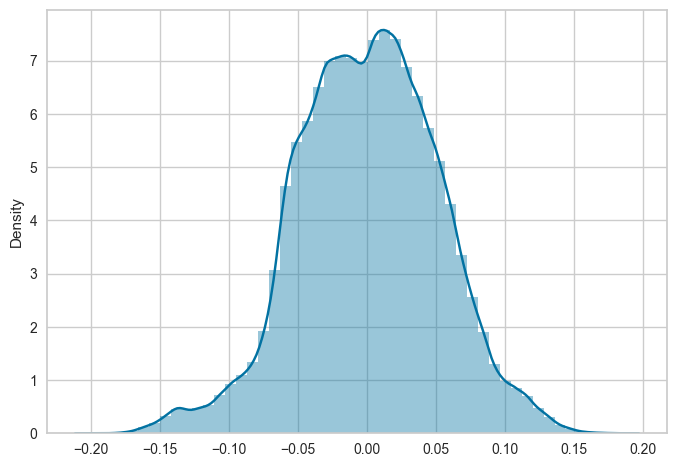

In [6]:
# plot distribution of embedding
sns.distplot(df_embedding)
plt.show()

Outliers



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



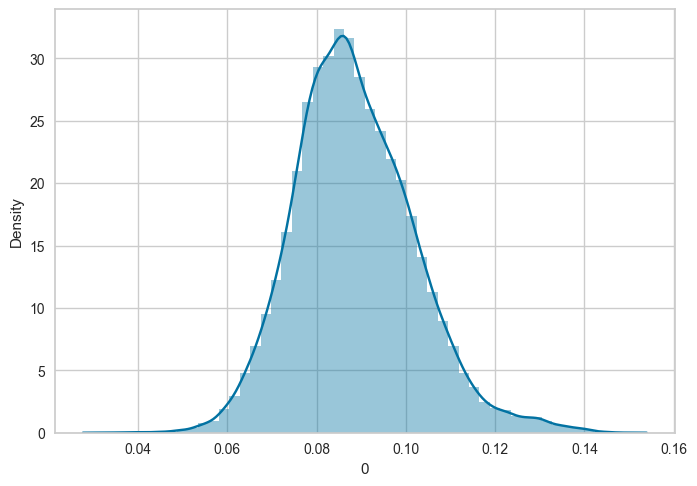

In [7]:
# plot distribution of embedding
sns.distplot(df_embedding['0'])
plt.show()

In [8]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)


df_embedding_with_out = df_embedding.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [9]:
df = df[df["outliers"] == 0]
df = df.drop(["outliers"], axis = 1)
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes


In [10]:
df_embedding_no_out.shape

(40690, 384)

In [11]:
df_embedding_with_out.shape

(45211, 384)

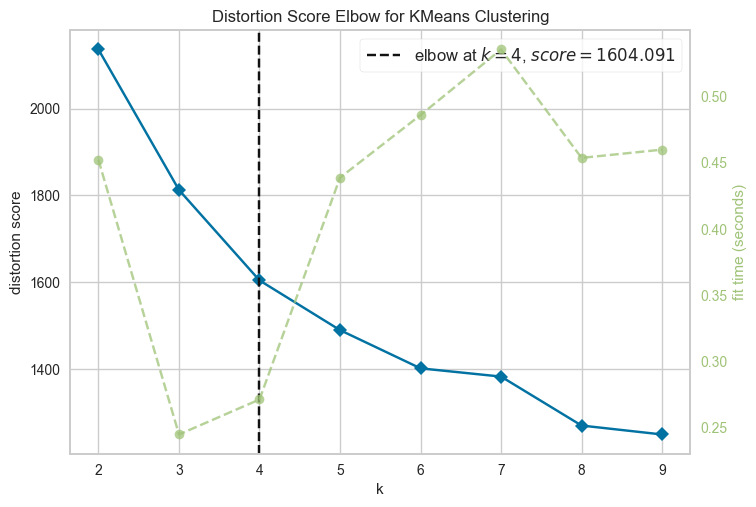

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [12]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True)

visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

Best Number of Clusters

In [13]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(df_embedding_no_out, n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

![Alt text](kpropotype_no_out.png)

The best number is 5-6

Modeling

In [14]:
################# Agglomerative Clustering #################

In [15]:
n_clusters = 4

In [16]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043648,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
5,0.105711,0.029028,0.054330,0.034277,-0.047293,-0.005095,-0.066823,-0.025780,-0.042089,0.003322,...,0.040330,-0.003890,0.051029,0.002328,-0.036691,-0.018359,0.152053,-0.043776,-0.012175,0.037961
6,0.100719,0.011405,0.045091,0.026381,-0.060358,-0.019738,-0.056603,-0.028006,-0.047109,-0.012747,...,0.046171,0.005057,0.044685,0.006080,-0.061556,-0.019891,0.154165,-0.038047,-0.024176,0.032574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,0.072025,0.022744,0.049914,0.014841,-0.081187,-0.023930,-0.028337,-0.001867,-0.063026,-0.008280,...,0.039822,0.001976,0.046991,0.000022,-0.053003,-0.029256,0.141078,-0.024602,-0.016670,0.033080
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002852,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620


In [17]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# # Sample a subset of the data
# sample_size = 10000
# data_sample = data_no_outliers.sample(n=sample_size, random_state=42)

# Generate the linkage matrix
Z = linkage(df_embedding_no_out, "ward")



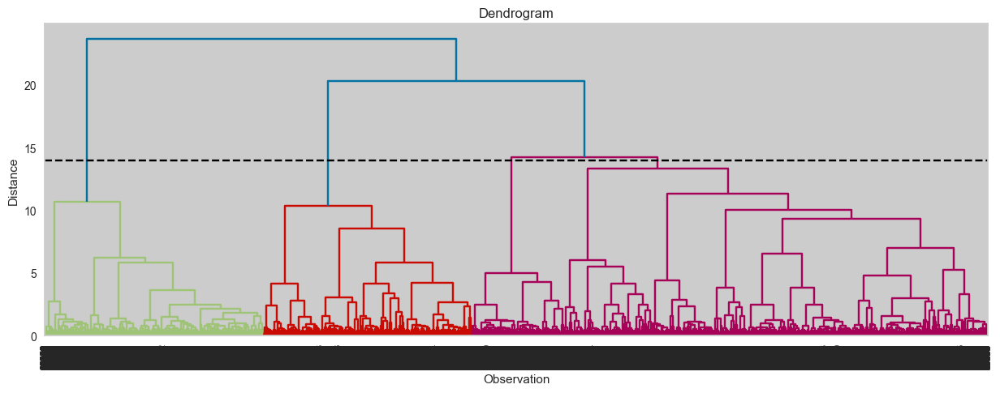

In [31]:
# plot the dendrogram
plt.figure(figsize=(15, 5))
plt.title("Dendrogram")
plt.xlabel("Observation")
plt.ylabel("Distance")
dendrogram(Z, leaf_rotation=90., leaf_font_size=8.)
plt.axhline(y=14, color='black', linestyle='--')
plt.show()

In [19]:
# cut the dendrogram at a distance of 59 and draw a horizontal line
from scipy.cluster.hierarchy import fcluster
max_dist = 14
clusters = fcluster(Z, max_dist, criterion='distance')

# number of unique clusters
n_clusters = len(np.unique(clusters))
n_clusters

4

In [20]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters)}")

Davies bouldin score: 1.8735981686854701
Calinski Score: 6630.597734550802
Silhouette Score: 0.18237084392735134


In [21]:
# plot the clusters in 3D
pca_3d_object, rfm_pca_3d = get_pca_3d(df_embedding_no_out, clusters)
plot_pca_3d(rfm_pca_3d, title = "Hierarchical Clustering Dendrogram")
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             65.560        17.07%                     17.07%
1             50.054        13.03%                     30.11%
2             39.666        10.33%                     40.44%


In [22]:
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out, clusters)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.5)

In [23]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=700, 
                  init='random', 
                  perplexity=100, 
                  n_iter = 1000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=1, width_line = 0.1)

In [24]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


In [25]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043648,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
5,0.105711,0.029028,0.054330,0.034277,-0.047293,-0.005095,-0.066823,-0.025780,-0.042089,0.003322,...,0.040330,-0.003890,0.051029,0.002328,-0.036691,-0.018359,0.152053,-0.043776,-0.012175,0.037961
6,0.100719,0.011405,0.045091,0.026381,-0.060358,-0.019738,-0.056603,-0.028006,-0.047109,-0.012747,...,0.046171,0.005057,0.044685,0.006080,-0.061556,-0.019891,0.154165,-0.038047,-0.024176,0.032574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,0.072025,0.022744,0.049914,0.014841,-0.081187,-0.023930,-0.028337,-0.001867,-0.063026,-0.008280,...,0.039822,0.001976,0.046991,0.000022,-0.053003,-0.029256,0.141078,-0.024602,-0.016670,0.033080
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002852,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620


In [26]:
df["cluster"] = clusters

df_group = df.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("job").reset_index()
df_group

,cluster,job,marital,education,housing,loan,age,balance,default
0,1,blue-collar,married,secondary,yes,no,40.049272,1064.060034,no
1,2,management,single,secondary,yes,no,34.199332,1296.936637,no
2,4,management,married,secondary,yes,no,44.565783,1504.930527,no
3,3,technician,married,secondary,yes,no,41.917958,1283.759208,no


In [27]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043648,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
5,0.105711,0.029028,0.054330,0.034277,-0.047293,-0.005095,-0.066823,-0.025780,-0.042089,0.003322,...,0.040330,-0.003890,0.051029,0.002328,-0.036691,-0.018359,0.152053,-0.043776,-0.012175,0.037961
6,0.100719,0.011405,0.045091,0.026381,-0.060358,-0.019738,-0.056603,-0.028006,-0.047109,-0.012747,...,0.046171,0.005057,0.044685,0.006080,-0.061556,-0.019891,0.154165,-0.038047,-0.024176,0.032574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,0.072025,0.022744,0.049914,0.014841,-0.081187,-0.023930,-0.028337,-0.001867,-0.063026,-0.008280,...,0.039822,0.001976,0.046991,0.000022,-0.053003,-0.029256,0.141078,-0.024602,-0.016670,0.033080
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002852,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620


Evaluation

In [28]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters)}")

Davies bouldin score: 1.8735981686854701
Calinski Score: 6630.597734550802


Silhouette Score: 0.18237084392735134


In [29]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043648,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
5,0.105711,0.029028,0.054330,0.034277,-0.047293,-0.005095,-0.066823,-0.025780,-0.042089,0.003322,...,0.040330,-0.003890,0.051029,0.002328,-0.036691,-0.018359,0.152053,-0.043776,-0.012175,0.037961
6,0.100719,0.011405,0.045091,0.026381,-0.060358,-0.019738,-0.056603,-0.028006,-0.047109,-0.012747,...,0.046171,0.005057,0.044685,0.006080,-0.061556,-0.019891,0.154165,-0.038047,-0.024176,0.032574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,0.072025,0.022744,0.049914,0.014841,-0.081187,-0.023930,-0.028337,-0.001867,-0.063026,-0.008280,...,0.039822,0.001976,0.046991,0.000022,-0.053003,-0.029256,0.141078,-0.024602,-0.016670,0.033080
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002852,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620


In [30]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

NameError: name 'clusters_predict' is not defined

![Alt text](img/embedding1.png)

In [ ]:
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)


![Alt text](img/embedding2.png)

t-SNE   3D

In [ ]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)


![Alt text](img/embedding3.png)

In [ ]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

t-SNE 2D

In [ ]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=0.5, width_line = 0.5)


![Alt text](img/embedding4.png)

In [ ]:
plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


<h1> Explanations </h1>

In [ ]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,outliers
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,1
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes,0
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes,0
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes,0
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no,0


In [ ]:
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [ ]:
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)

for col in ["job", "marital", "education", "housing", "loan", "default"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')

clf_km.fit(X = df_no_outliers , y = clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: contact: object, month: object, poutcome: object, y: object

In [ ]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training-set accuracy score: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5274
           1       1.00      1.00      1.00      2172
           2       1.00      1.00      1.00      1896
           3       1.00      1.00      1.00      2939
           4       1.00      1.00      1.00      5719

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



Cluster Info

In [ ]:
df_no_outliers

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,cluster
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,2
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,1
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no,2
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes,0
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes,3
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes,2
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes,2


In [ ]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("job").reset_index()
df_group

,cluster,job,marital,education,housing,loan,age,balance,default
0,1,blue-collar,married,secondary,yes,no,40.106569,1056.284680,no
1,0,management,single,secondary,yes,no,34.159544,1304.061201,no
2,2,management,married,secondary,yes,no,44.894504,1541.404135,no
3,3,technician,married,secondary,yes,no,42.212265,1212.023126,no
